In [1]:
pip install lime

In [2]:
%matplotlib inline
import shap
import lime
import lightgbm as lgb
import xgboost as xgb
import matplotlib.pyplot as plt
import sklearn
from sklearn import preprocessing, metrics, model_selection
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder, LabelBinarizer 
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score, recall_score, precision_score, f1_score, precision_recall_curve
from sklearn.model_selection import KFold, StratifiedKFold, GridSearchCV, train_test_split
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from datetime import datetime, date, timezone, timedelta
import seaborn as sns
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os, gc
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
sns.set()

./gender_submission.csv
./train.csv
./test.csv
./.config/.last_opt_in_prompt.yaml
./.config/gce
./.config/.last_survey_prompt.yaml
./.config/.last_update_check.json
./.config/config_sentinel
./.config/active_config
./.config/logs/2021.05.06/13.44.01.543195.log
./.config/logs/2021.05.06/13.43.39.026092.log
./.config/logs/2021.05.06/13.43.04.692209.log
./.config/logs/2021.05.06/13.44.00.991142.log
./.config/logs/2021.05.06/13.43.23.909017.log
./.config/logs/2021.05.06/13.43.44.620859.log
./.config/configurations/config_default
./sample_data/README.md
./sample_data/anscombe.json
./sample_data/california_housing_test.csv
./sample_data/mnist_test.csv
./sample_data/mnist_train_small.csv
./sample_data/california_housing_train.csv


In [3]:
df_train = pd.read_csv('./train.csv')
df_test = pd.read_csv('./test.csv')
display(df_train.info())
display(df_train.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


None

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
def feature_engineering(df):
    # Null Value Handling
    df["Age"].fillna(df["Age"].median(),inplace=True)
    df["Embarked"].fillna(df['Embarked'].mode()[0], inplace = True)
    df = df.fillna(-1)
    
    # Feature Encoding
    df["Sex"] = df["Sex"].map({'male':1,'female':0}).fillna(-1).astype(int)
    df["Embarked"] = df["Embarked"].map({'S':0,'C':1,'Q':2}).astype(int)
    df["Cabin"] = df["Cabin"].str[0].map({'T':0,'G':1,'F':2,'E':3,'D':4,'C':5,'B':6,'A':7}).fillna(-1).astype(int)
    
    # Binning
    bins_age = np.linspace(0, 100, 10)
    df["AgeBin"] = np.digitize(df["Age"], bins=bins_age)
    
    df["FareBin"] = 0
    df["FareBin"][(df["Fare"]>=0)&(df["Fare"]<10)] = 1
    df["FareBin"][(df["Fare"]>=10)&(df["Fare"]<20)] = 2
    df["FareBin"][(df["Fare"]>=20)&(df["Fare"]<30)] = 3
    df["FareBin"][(df["Fare"]>=30)&(df["Fare"]<40)] = 4
    df["FareBin"][(df["Fare"]>=40)&(df["Fare"]<50)] = 5
    df["FareBin"][(df["Fare"]>=50)&(df["Fare"]<100)] = 6
    df["FareBin"][(df["Fare"]>=100)] = 7

    # Create New Features (Optional)
    df['FamilySize'] = df['SibSp'] + df['Parch'] + 1
    df['Title'] = -1
    df['Title'][df["Name"].str.contains("Mr")] = 0
    df['Title'][df["Name"].str.contains("Master")] = 1
    df['Title'][df["Name"].str.contains("Miss")] = 2
    df['Title'][df["Name"].str.contains("Mrs")] = 3
    
    # Drop unsed columns
    del df["Age"]
    del df["Fare"]
    del df["Ticket"]
    
    return df

In [5]:
df_train_fe = feature_engineering(df_train)
df_test_fe = feature_engineering(df_test)

display(df_train_fe.head())


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Cabin,Embarked,AgeBin,FareBin,FamilySize,Title
0,1,0,3,"Braund, Mr. Owen Harris",1,1,0,-1,0,2,1,2,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,1,0,5,1,4,6,2,3
2,3,1,3,"Heikkinen, Miss. Laina",0,0,0,-1,0,3,1,1,2
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,1,0,5,0,4,6,2,3
4,5,0,3,"Allen, Mr. William Henry",1,0,0,-1,0,4,1,1,0


In [6]:
exclude_columns = [
    'Name',
    'Ticket',
    'PassengerId',
    'Survived'
]

evals_result = {}
features = [c for c in df_train_fe.columns if c not in exclude_columns]
target = df_train_fe['Survived']
print(len(target))

gc.collect()

X_train, X_test, y_train, y_test = train_test_split(df_train_fe[features], target, test_size=0.2, random_state=440)

param = {   
    'boost': 'gbdt',
    'learning_rate': 0.008,
    'feature_fraction':0.20,
    'bagging_freq':1,
    'bagging_fraction':1,
    'max_depth': -1,
    'num_leaves':17,
    'lambda_l2': 0.9,
    'lambda_l1': 0.9,
    'max_bin':200,
    'metric':{'auc','binary_logloss'},
#    'metric':{'binary_logloss'},
    'tree_learner': 'serial',
    'objective': 'binary',
    'verbosity': 1,
}

oof = np.zeros(len(df_train_fe))
predictions = np.zeros(len(df_test_fe))
feature_importance_train = pd.DataFrame()

# lgb_train = lgb.Dataset(X_train, y_train)
# lgb_valid = lgb.Dataset(X_test, y_test)
# num_round = 10000
# clf = lgb.train(param, lgb_train, num_round, valid_sets = [lgb_train, lgb_valid],
#       verbose_eval=100, early_stopping_rounds = 1000, evals_result = evals_result)
# oof = clf.predict(X_test, num_iteration=clf.best_iteration)





891


In [32]:
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
clf1 = LogisticRegression(random_state=1)
clf2 = RandomForestClassifier(n_estimators=50, random_state=1)
clf3 = GaussianNB()
eclf = VotingClassifier(
          estimators=[('lr', clf1), ('rf', clf2), ('gnb', clf3)],
          voting='soft')

clf = clf2.fit(X_train, y_train)
oof = clf.predict(X_test)
# evals_result = clf.best_estimator_.evals_result()

In [30]:
from sklearn.model_selection import cross_val_score
for clfx, label in zip([clf1, clf2, clf3, clf], ['Logistic Regression', 'Random Forest', 'naive Bayes', 'Ensemble']):
     scores = cross_val_score(clfx, X_train, y_train, scoring='accuracy', cv=5)
     print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))

Accuracy: 0.80 (+/- 0.02) [Logistic Regression]
Accuracy: 0.83 (+/- 0.02) [Random Forest]
Accuracy: 0.77 (+/- 0.03) [naive Bayes]
Accuracy: 0.83 (+/- 0.02) [Ensemble]


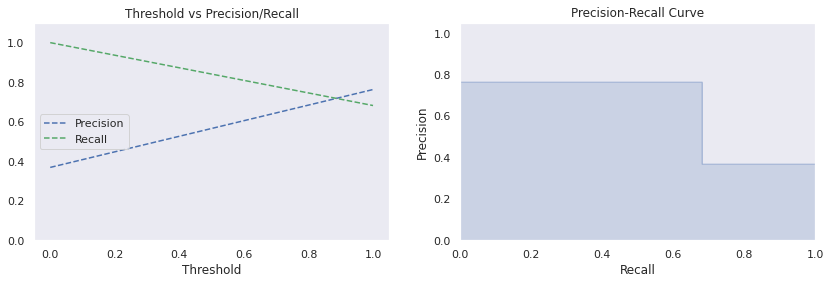

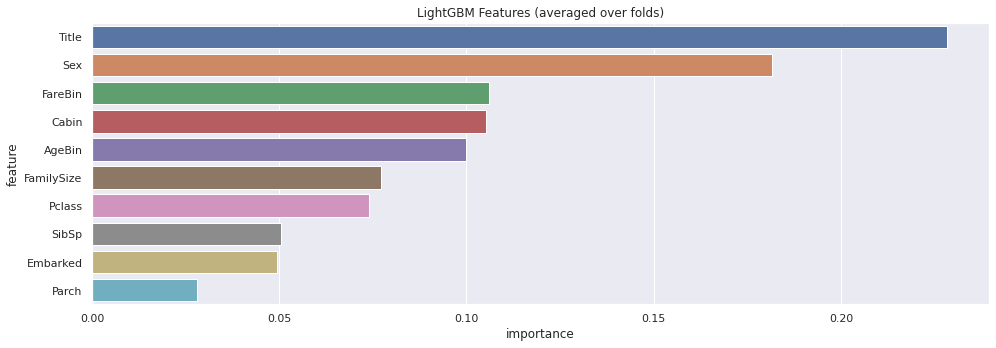

In [39]:
## Prediction
# predictions = clf.predict(df_test_fe[features], num_iteration=clf.best_iteration)
predictions = clf.predict(df_test_fe[features])
# Visualize Metrics
# axL = lgb.plot_metric(evals_result, metric='auc')
# axL.set_title('AUC')
# axL.set_xlabel('Iterations')
# axL.set_ylim(0,1.1)
# axR = lgb.plot_metric(evals_result, metric='binary_logloss')        
# axR.set_title('Binary_Logloss')
# axR.set_xlabel('Iterations')
# plt.show()

# # Importance
fold_importance_train = pd.DataFrame()
fold_importance_train["feature"] = features
fold_importance_train["importance"] = clf.feature_importances_
fold_importance_train["fold"] = 1
feature_importance_train = pd.concat([feature_importance_train, fold_importance_train], axis=0)

precisions, recalls, thresholds = precision_recall_curve(y_test, oof)

fig = plt.figure(figsize=(14,4))

### Threshold vs Precision/Recall
ax = fig.add_subplot(1,2,1)
ax.plot(thresholds, precisions[:-1], "b--", label="Precision")
ax.plot(thresholds, recalls[:-1], "g--", label="Recall")
ax.set_title("Threshold vs Precision/Recall")
ax.set_xlabel("Threshold")
ax.legend(loc="center left")
ax.set_ylim([0,1.1])
ax.grid()
fig.show()

### Precision-Recall Curve
ax = fig.add_subplot(1,2,2)
ax.step(recalls, precisions, color='b', alpha=0.2, where='post')
ax.fill_between(recalls, precisions, step='post', alpha=0.2, color='b')
ax.set_title('Precision-Recall Curve')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_ylim([0.0, 1.05])
ax.set_xlim([0.0, 1.0])
ax.grid()
fig.show()

df_train_result = pd.DataFrame()
df_train_result['Actual Result'] = y_test
df_train_result['Prediction Score'] = oof
df_train_result = df_train_result.sort_values('Prediction Score',ascending=False).sort_index(ascending=False)
df_target = df_train_result[df_train_result['Actual Result']==1]
df_nontarget = df_train_result[df_train_result['Actual Result']==0]

### Show Importance
cols = (feature_importance_train[["feature","importance"]]
        .groupby("feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:1000].index)
best_features = feature_importance_train.loc[feature_importance_train.feature.isin(cols)]

plt.figure(figsize=(14,5))
sns.barplot(x="importance", y="feature", 
            data=best_features.sort_values(by="importance",ascending=False))
plt.title('LightGBM Features (averaged over folds)')
plt.tight_layout()

# Model Interpretation by LIME

In [42]:
import lime
import lime.lime_tabular

In [45]:
predict_fn_rf = lambda x: clf.predict_proba(x).astype(float)
X = X_train.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_train.columns,class_names=['Will Die','Will Survive'],kernel_width=5)

In [49]:
 X_test.iloc[[1]].values[0]

array([1, 0, 1, 0, 4, 0, 6, 6, 2, 2])

In [50]:
choosen_instance = X_test.iloc[[1]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [53]:
choosen_instance = X_test.iloc[[44]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [54]:
choosen_instance = X_test.iloc[[55]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [55]:
choosen_instance = X_test.iloc[[66]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

In [56]:
choosen_instance = X_test.iloc[[77]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10)
exp.show_in_notebook(show_all=False)

# Model Interpretation by SHAP

In [58]:
shap.initjs()
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_train)

## Summary_plot

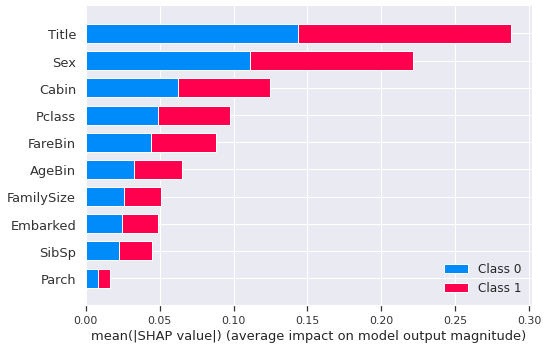

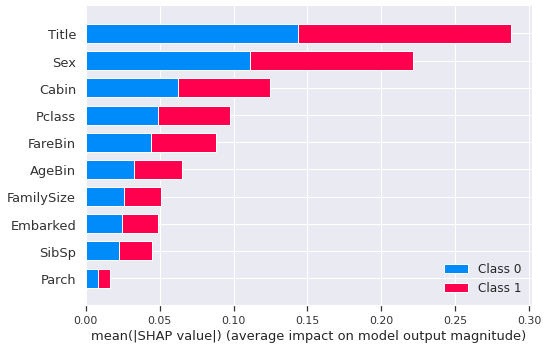

In [59]:
shap.summary_plot(shap_values, X_train)
shap.summary_plot(shap_values, X_train, plot_type='bar')

In [60]:
shap_values[1][0,:], X_train.iloc[0,:]

(array([ 0.06646262,  0.19110328, -0.0033493 ,  0.00960075,  0.0830628 ,
        -0.01263416, -0.00460591,  0.08997678,  0.01732461,  0.17620459]),
 Pclass        1
 Sex           0
 SibSp         1
 Parch         0
 Cabin         5
 Embarked      0
 AgeBin        4
 FareBin       6
 FamilySize    2
 Title         3
 Name: 3, dtype: int64)

In [61]:
shap_values[1]

array([[ 0.06646262,  0.19110328, -0.0033493 , ...,  0.08997678,
         0.01732461,  0.17620459],
       [ 0.08116483,  0.1586818 ,  0.01383242, ...,  0.0684414 ,
         0.01199998,  0.14539575],
       [-0.04273076, -0.07987216, -0.00768782, ...,  0.00034862,
         0.00292514, -0.13617398],
       ...,
       [-0.05354065,  0.16661134,  0.03148912, ..., -0.01407587,
         0.03765997,  0.18854982],
       [ 0.02818658, -0.1153274 ,  0.00358846, ..., -0.01407318,
        -0.00074974, -0.14464252],
       [-0.11202685,  0.13870088, -0.12773228, ..., -0.06599793,
        -0.20054708,  0.08060197]])

# Force Plot

In [62]:
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_train.iloc[0,:])

In [63]:
shap.force_plot(explainer.expected_value[1], shap_values[1][1,:], X_train.iloc[1,:])

In [64]:
shap.force_plot(explainer.expected_value[1], shap_values[1][2,:], X_train.iloc[2,:])

In [65]:
shap.force_plot(explainer.expected_value[1], shap_values[1][3,:], X_train.iloc[3,:])

In [66]:
shap.force_plot(base_value=explainer.expected_value[1], shap_values=shap_values[1], features=X_train.columns)

In [ ]:
df_train_fe.columns

# Dependency Plot

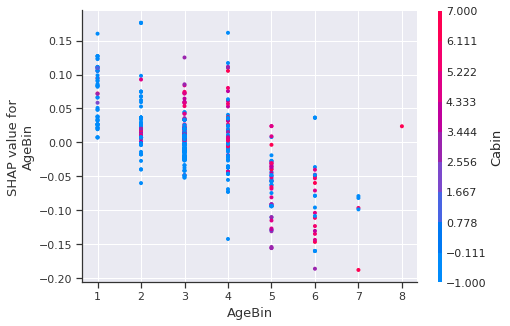

In [67]:
shap.dependence_plot("AgeBin",shap_values[1], X_train)


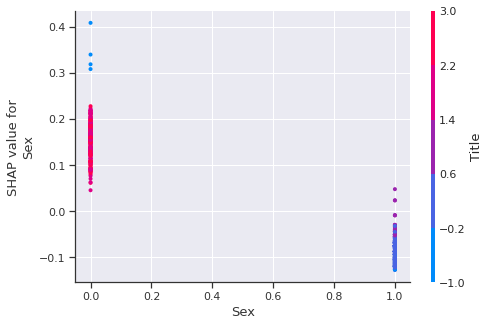

In [68]:
shap.dependence_plot("Sex",shap_values[1], X_train)


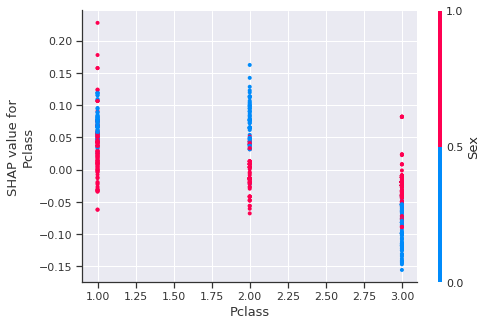

In [69]:
shap.dependence_plot("Pclass",shap_values[1], X_train)


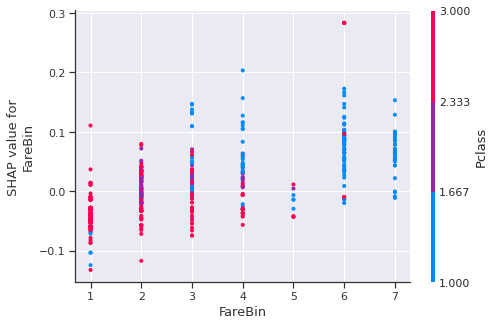

In [70]:
shap.dependence_plot("FareBin",shap_values[1], X_train)
